### Load libraries

In [1]:

from cobra.flux_analysis import flux_variability_analysis
#from cobra.io import read_sbml_model
import cobra
import numpy as np
import networkx as nx
from dingo.illustrations import plot_graph
from cobra.flux_analysis.loopless import loopless_solution
import pickle
from dingo import MetabolicNetwork

import matplotlib.pyplot as plt
import pandas as pd



from utils import load_model, get_objective_functions, fva_dictionary, get_reaction_bounds
from utils import modify_model, sampling_statistics, sample_dingo, sample_optgp
from utils import get_loopless_solutions_from_samples, calculate_affected_samples, plot_grid_95_reactions, set_bounds_from_loopless_solution_samples

/home/touliopoulos/.local/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home/touliopoulos/.local/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


### Load initial model and extract information

In [2]:
ec_cobra_model, ec_cobra_reactions, ec_dingo_model, ec_dingo_reactions = load_model("/home/touliopoulos/project/erasmus/erasmus_2025_project/ext_data/models/e_coli_core.xml")

objective_functions = get_objective_functions(ec_cobra_model)
print(objective_functions)

default_reaction_bounds = get_reaction_bounds(ec_cobra_model)
print(default_reaction_bounds)


Set parameter Username
Set parameter LicenseID to value 2642044
Academic license - for non-commercial use only - expires 2026-03-25
['BIOMASS_Ecoli_core_w_GAM']
{'PFK': (0.0, 1000.0), 'PFL': (0.0, 1000.0), 'PGI': (-1000.0, 1000.0), 'PGK': (-1000.0, 1000.0), 'PGL': (0.0, 1000.0), 'ACALD': (-1000.0, 1000.0), 'AKGt2r': (-1000.0, 1000.0), 'PGM': (-1000.0, 1000.0), 'PIt2r': (-1000.0, 1000.0), 'ALCD2x': (-1000.0, 1000.0), 'ACALDt': (-1000.0, 1000.0), 'ACKr': (-1000.0, 1000.0), 'PPC': (0.0, 1000.0), 'ACONTa': (-1000.0, 1000.0), 'ACONTb': (-1000.0, 1000.0), 'ATPM': (8.39, 1000.0), 'PPCK': (0.0, 1000.0), 'ACt2r': (-1000.0, 1000.0), 'PPS': (0.0, 1000.0), 'ADK1': (-1000.0, 1000.0), 'AKGDH': (0.0, 1000.0), 'ATPS4r': (-1000.0, 1000.0), 'PTAr': (-1000.0, 1000.0), 'PYK': (0.0, 1000.0), 'BIOMASS_Ecoli_core_w_GAM': (0.0, 1000.0), 'PYRt2': (-1000.0, 1000.0), 'CO2t': (-1000.0, 1000.0), 'RPE': (-1000.0, 1000.0), 'CS': (0.0, 1000.0), 'RPI': (-1000.0, 1000.0), 'SUCCt2_2': (0.0, 1000.0), 'CYTBD': (0.0, 1000.

### Generate samples

In [3]:

ec_cobra_model_biomass_obj_0_opt, ec_dingo_model_biomass_obj_0_opt = modify_model(ec_cobra_model, objective_function="BIOMASS_Ecoli_core_w_GAM", optimal_percentage=0)
ec_cobra_model_biomass_obj_99_opt, ec_dingo_model_biomass_obj_99_opt = modify_model(ec_cobra_model, objective_function="BIOMASS_Ecoli_core_w_GAM", optimal_percentage=99)
ec_cobra_model_biomass_obj_100_opt, ec_dingo_model_biomass_obj_100_opt = modify_model(ec_cobra_model, objective_function="BIOMASS_Ecoli_core_w_GAM", optimal_percentage=100)


samples_dingo_biomass_obj_0_opt = sample_dingo(ec_dingo_model_biomass_obj_0_opt, reaction_in_rows = True, ess=2000)
print(samples_dingo_biomass_obj_0_opt.shape)

samples_dingo_biomass_obj_99_opt = sample_dingo(ec_dingo_model_biomass_obj_99_opt, reaction_in_rows = True, ess=2000)
print(samples_dingo_biomass_obj_99_opt.shape)

samples_dingo_biomass_obj_100_opt = sample_dingo(ec_dingo_model_biomass_obj_100_opt, reaction_in_rows = True, ess=2000)
print(samples_dingo_biomass_obj_100_opt.shape)


samples_optgp_biomass_obj_0_opt = sample_optgp(ec_cobra_model_biomass_obj_0_opt, n_samples = samples_dingo_biomass_obj_0_opt.shape[1], reaction_in_rows = True)
samples_optgp_biomass_obj_99_opt = sample_optgp(ec_cobra_model_biomass_obj_99_opt, n_samples = samples_dingo_biomass_obj_99_opt.shape[1], reaction_in_rows = True)
samples_optgp_biomass_obj_100_opt = sample_optgp(ec_cobra_model_biomass_obj_100_opt, n_samples = samples_dingo_biomass_obj_100_opt.shape[1], reaction_in_rows = True)



Read LP format model from file /tmp/tmpcdq9mvoz.lp
Reading time = 0.00 seconds
: 72 rows, 190 columns, 720 nonzeros
Read LP format model from file /tmp/tmp71hpiglm.lp
Reading time = 0.00 seconds
: 72 rows, 190 columns, 720 nonzeros
Read LP format model from file /tmp/tmp3x0uunux.lp
Reading time = 0.00 seconds
: 72 rows, 190 columns, 720 nonzeros
Set parameter Username
Set parameter LicenseID to value 2642044
Academic license - for non-commercial use only - expires 2026-03-25
phase 1: number of correlated samples = 500, effective sample size = 10, ratio of the maximum singilar value over the minimum singular value = 1138.68
phase 2: number of correlated samples = 500, effective sample size = 129, ratio of the maximum singilar value over the minimum singular value = 2.04328
phase 3: number of correlated samples = 2400, effective sample size = 930
phase 4: number of correlated samples = 2400, effective sample size = 952
[5]total ess 2021: number of correlated samples = 5800




[5]maximum marginal PSRF: 1.00036


(95, 5800)
phase 1: number of correlated samples = 500, effective sample size = 7, ratio of the maximum singilar value over the minimum singular value = 817.145
phase 2: number of correlated samples = 500, effective sample size = 8, ratio of the maximum singilar value over the minimum singular value = 81.4608
phase 3: number of correlated samples = 500, effective sample size = 148, ratio of the maximum singilar value over the minimum singular value = 2.2565
phase 4: number of correlated samples = 2400, effective sample size = 1121
phase 5: number of correlated samples = 1600, effective sample size = 738
[5]total ess 2022: number of correlated samples = 5500


(95, 5500)


[5]maximum marginal PSRF: 1.02261


phase 1: number of correlated samples = 500, effective sample size = 6, ratio of the maximum singilar value over the minimum singular value = 1780.35
phase 2: number of correlated samples = 500, effective sample size = 3, ratio of the maximum singilar value over the minimum singular value = 376.151
phase 3: number of correlated samples = 500, effective sample size = 4, ratio of the maximum singilar value over the minimum singular value = 418.758
phase 4: number of correlated samples = 500, effective sample size = 91, ratio of the maximum singilar value over the minimum singular value = 9.49913
phase 5: number of correlated samples = 500, effective sample size = 177, ratio of the maximum singilar value over the minimum singular value = 3.31682
phase 6: number of correlated samples = 500, effective sample size = 186, ratio of the maximum singilar value over the minimum singular value = 2.69399
phase 7: number of correlated samples = 2400, effective sample size = 1178
phase 8: number of c

[5]maximum marginal PSRF: 1.01219


Read LP format model from file /tmp/tmpkbfavgbx.lp
Reading time = 0.00 seconds
: 72 rows, 190 columns, 720 nonzeros
Read LP format model from file /tmp/tmps21tqtzt.lp
Reading time = 0.00 seconds
: 72 rows, 190 columns, 720 nonzeros


### Define samples to procceed

In [4]:
samples_optgp_ec_model = samples_optgp_biomass_obj_0_opt

samples_dingo_ec_model = samples_dingo_biomass_obj_0_opt


### Plot the distribution of reactions fluxes

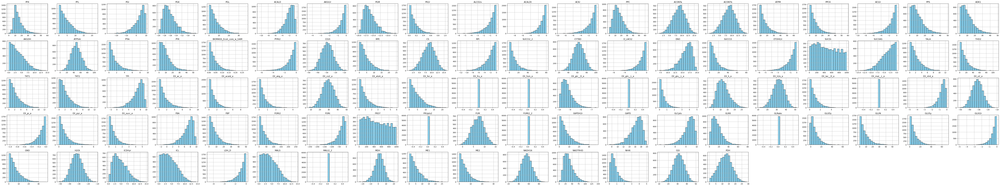

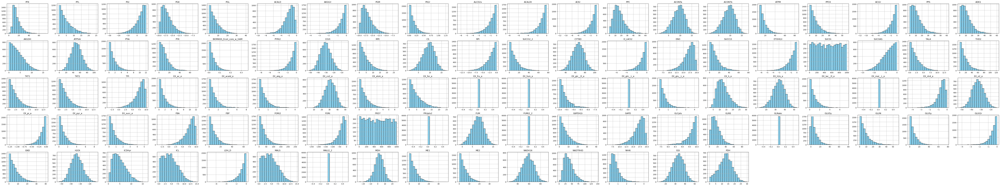

In [5]:

plot_grid_95_reactions(samples_optgp_ec_model, ec_cobra_model, nrows=5, ncols=20)
plot_grid_95_reactions(samples_dingo_ec_model, ec_cobra_model, nrows=5, ncols=20)


### Calculate the loopless solution and save to numpy 2D array

In [6]:

samples_dingo_ec_model_loopless_solutions = get_loopless_solutions_from_samples(samples_dingo_ec_model, ec_cobra_model)

print(samples_dingo_ec_model.shape)
print(samples_dingo_ec_model_loopless_solutions.shape)


samples_optgp_ec_model_loopless_solutions = get_loopless_solutions_from_samples(samples_optgp_ec_model, ec_cobra_model)

print(samples_optgp_ec_model.shape)
print(samples_optgp_ec_model_loopless_solutions.shape)


/home/touliopoulos/.local/lib/python3.10/site-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


(95, 5800)
(95, 5800)
(95, 5802)
(95, 5802)


### Check how much a random reaction (FRD7) was affected by loopless solution

In [7]:

mean, min, max, std, skewness, kurtosis = sampling_statistics(samples_dingo_ec_model, reactions_ids_list=ec_dingo_reactions, reaction_id="FRD7")
print(mean, min, max, std, skewness, kurtosis)

mean, min, max, std, skewness, kurtosis = sampling_statistics(samples_dingo_ec_model_loopless_solutions, reactions_ids_list=ec_dingo_reactions, reaction_id="FRD7")
print(mean, min, max, std, skewness, kurtosis)


mean, min, max, std, skewness, kurtosis = sampling_statistics(samples_optgp_ec_model, reactions_ids_list=ec_dingo_reactions, reaction_id="FRD7")
print(mean, min, max, std, skewness, kurtosis)

mean, min, max, std, skewness, kurtosis = sampling_statistics(samples_optgp_ec_model_loopless_solutions, reactions_ids_list=ec_dingo_reactions, reaction_id="FRD7")
print(mean, min, max, std, skewness, kurtosis)


490.7095664326328 0.277083440002906 995.9960986756638 289.6832558107421 0.013556497034470984 -1.2232805502406539
0.00019580911021948967 0.0 1.13569283927304 0.014911091949721686 76.13803367859936 5795.000172443529
461.6466377217439 0.2598480928119429 995.0992569635875 284.71137723730254 0.16289818448960233 -1.18037743635804
7.914641235629984e-05 0.0 0.19176388686288925 0.0033332049511356292 47.91292545927871 2461.228895219278


### Check how much a random sample (the 1st) was affected by loopless solution

In [8]:
cobra_reactions_str = [str(reaction.id) for reaction in ec_cobra_model.reactions]
reactions_ranges = {cobra_reactions_str[i]: samples_dingo_ec_model[:, i].max() - samples_dingo_ec_model_loopless_solutions[:, i].min() for i in range(samples_dingo_ec_model.shape[0])}

# Check for 1st samples on default samples
df = pd.DataFrame({
    'value_1': samples_dingo_ec_model_loopless_solutions.T[0],
    'value_2': samples_dingo_ec_model.T[0],
    'difference': abs(samples_dingo_ec_model_loopless_solutions.T[0] - samples_dingo_ec_model.T[0])
})
df['norm_difference'] = df['difference'] / list(reactions_ranges.values())

df_filtered = df[df['difference'] > 0.1]
print("Filtered df of reactions with differences:\n" , df_filtered, df_filtered.shape)

df_no_differences = df[df['difference'] < 0.1]
print("Filtered df of reactions with no differences:\n" , df_no_differences, df_no_differences.shape)


Filtered df of reactions with differences:
       value_1    value_2  difference  norm_difference
0    9.882447  15.681402    5.798955         0.072771
2    9.879555   9.660099    0.219456         0.002004
4    0.016150   0.235605    0.219456         0.001526
12   7.007928   8.764193    1.756265         0.006395
15  62.987473  12.638968   50.348505         0.180179
16   0.000000   2.194278    2.194278         0.007574
18   0.000000   1.340379    1.340379         0.018517
19   0.000000   1.340379    1.340379         0.012750
20   0.000000   2.733171    2.733171         0.025860
21  46.372002  18.583469   27.788533         0.268819
23   2.837840   4.543081    1.705241         0.002750
27   0.003599   0.149903    0.146304         0.000375
30   0.000000   8.919684    8.919684         0.017736
34   0.178348   9.098032    8.919684         0.013015
36   4.954785  58.386943   53.432158         0.078015
37   0.000000  -2.733171    2.733171         0.005121
39   0.000000  26.163032   26.163032  

### Find which reactions from the default model have significant differences with themselves after applying loopless solution. 

This can be done by comparing their distributions (before and after). This may reveal reactions participating in loops

### Find how many samples (e.g. percentage) from a model constrained with loopless FVA solution have significant differences with themselves after applying loopless solution. 

This can be done by setting a tolerance value, e.g. tol = 0.01, that will reveal whether reactions from a sample have significant differences (greater than this value) with themselves after loopless solution. In addition, calculating distances between samples before and after loopless solution (for 3000 samples ==> 3000 distances) and calculation of the average and standard deviation of these (3000) distances will show the efficiency of the FVA approach. 

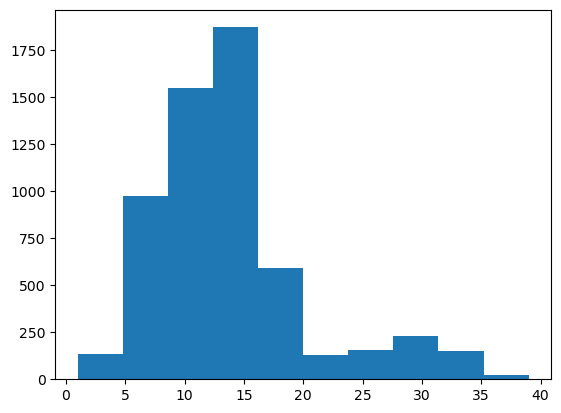

5800 affected samples out of (95, 5800) total samples


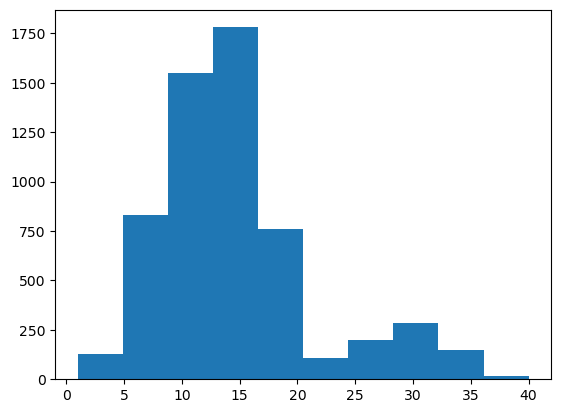

5802 affected samples out of (95, 5802) total samples


In [9]:

affected_reactions_count, total_affected_samples = calculate_affected_samples(samples_dingo_ec_model, 
                                                                              samples_dingo_ec_model_loopless_solutions, 
                                                                              ec_cobra_model, 
                                                                              tol_reaction_difference=0.2, 
                                                                              tol_reactions_count=1)

plt.hist(affected_reactions_count)
plt.show()
    
print(total_affected_samples, "affected samples out of", (samples_dingo_ec_model).shape, "total samples")



affected_reactions_count, total_affected_samples = calculate_affected_samples(samples_optgp_ec_model, 
                                                                              samples_optgp_ec_model_loopless_solutions, 
                                                                              ec_cobra_model, 
                                                                              tol_reaction_difference=0.2, 
                                                                              tol_reactions_count=1)

plt.hist(affected_reactions_count)
plt.show()
    
print(total_affected_samples, "affected samples out of", (samples_optgp_ec_model).shape, "total samples")


### Get the flux ranges from loopless solutions sampling and apply them as minimum and maximum reaction bounds

In [10]:

constrained_ec_cobra_model = set_bounds_from_loopless_solution_samples(samples_dingo_ec_model_loopless_solutions, ec_cobra_model)

# sample again with bounds constrained from loopless solutions
constrained_ec_dingo_model = MetabolicNetwork.from_cobra_model(constrained_ec_cobra_model)
samples_dingo_ec_model_constrained = sample_dingo(constrained_ec_dingo_model, reaction_in_rows = True, ess=2000)
print(samples_dingo_ec_model_constrained.shape)


samples_optgp_ec_model_constrained = sample_optgp(constrained_ec_cobra_model, n_samples = samples_dingo_ec_model_constrained.shape[1], reaction_in_rows = True)
print(samples_optgp_ec_model_constrained.shape)


Read LP format model from file /tmp/tmpoa8wycsg.lp
Reading time = 0.00 seconds
: 72 rows, 190 columns, 720 nonzeros
phase 1: number of correlated samples = 400, effective sample size = 2, ratio of the maximum singilar value over the minimum singular value = 2316.13
phase 2: number of correlated samples = 400, effective sample size = 3, ratio of the maximum singilar value over the minimum singular value = 1737.36
phase 3: number of correlated samples = 400, effective sample size = 136, ratio of the maximum singilar value over the minimum singular value = 116.803
phase 4: number of correlated samples = 400, effective sample size = 176, ratio of the maximum singilar value over the minimum singular value = 1
phase 5: number of correlated samples = 2000, effective sample size = 904
phase 6: number of correlated samples = 1800, effective sample size = 829
[5]total ess 2050: number of correlated samples = 5400


(95, 5400)
Read LP format model from file /tmp/tmp1quzjrg4.lp
Reading time = 0.01

[5]maximum marginal PSRF: 1.13042


(95, 5400)


### Plot distributions of reactions: from samples of default model, from samples of loopless solution applied to default samples and from model constrained with loopless solution bounds 

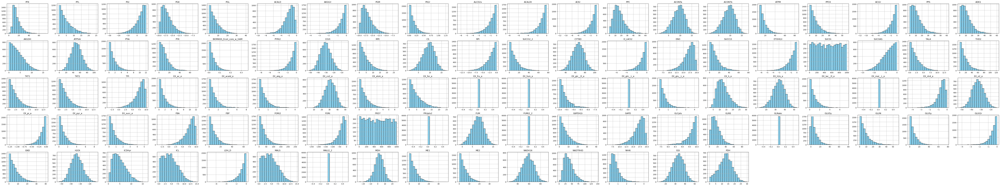

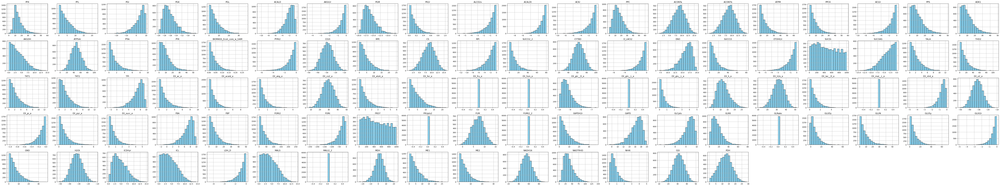

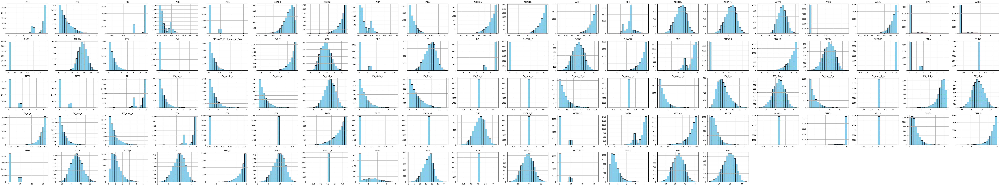

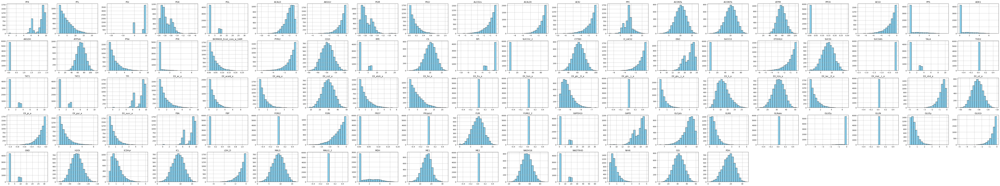

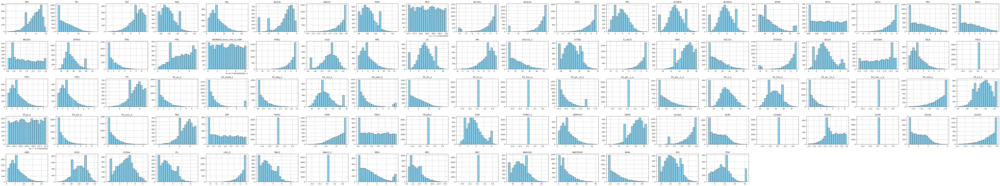

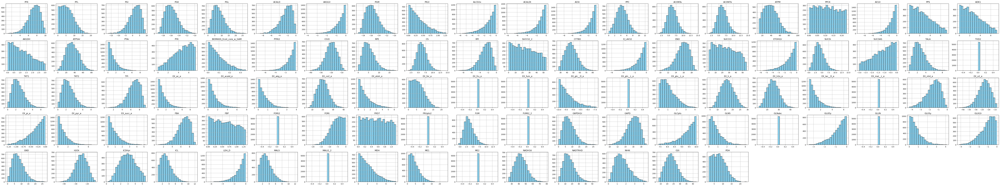

In [11]:
plot_grid_95_reactions(samples_dingo_ec_model, ec_cobra_model, nrows=5, ncols=20)
plot_grid_95_reactions(samples_optgp_ec_model, ec_cobra_model, nrows=5, ncols=20)

plot_grid_95_reactions(samples_dingo_ec_model_loopless_solutions, ec_cobra_model, nrows=5, ncols=20)
plot_grid_95_reactions(samples_optgp_ec_model_loopless_solutions, ec_cobra_model, nrows=5, ncols=20)

plot_grid_95_reactions(samples_dingo_ec_model_constrained, ec_cobra_model, nrows=5, ncols=20)
plot_grid_95_reactions(samples_optgp_ec_model_constrained, ec_cobra_model, nrows=5, ncols=20)


### Visualize network with graphs

In [12]:

correlation_matrix_ec_model = np.corrcoef(samples_dingo_ec_model)
correlation_matrix_ec_model[np.isnan(correlation_matrix_ec_model)] = 0
print(correlation_matrix_ec_model.shape)

correlation_matrix_ec_model_loopless_solutions = np.corrcoef(samples_dingo_ec_model_loopless_solutions)
correlation_matrix_ec_model_loopless_solutions[np.isnan(correlation_matrix_ec_model_loopless_solutions)] = 0
print(correlation_matrix_ec_model_loopless_solutions.shape)

correlation_matrix_ec_model_constrained = np.corrcoef(samples_dingo_ec_model_constrained)
correlation_matrix_ec_model_constrained[np.isnan(correlation_matrix_ec_model_constrained)] = 0
print(correlation_matrix_ec_model_constrained.shape)


def graphs(correlation_matrix, reactions, correction=True):
       
    graph_matrix = correlation_matrix.copy()
    np.fill_diagonal(graph_matrix, 0)
    
    if correction == True:
        graph_matrix = abs(graph_matrix)
        
    G = nx.from_numpy_array(graph_matrix)
    G = nx.relabel_nodes(G, lambda x: reactions[x])
    
    pos = nx.spring_layout(G)
    unconnected_nodes = list(nx.isolates(G))
    print(unconnected_nodes)
    G.remove_nodes_from(unconnected_nodes)
    
    center_x = np.mean([p[0] for p in pos.values()])
    center_y = np.mean([p[1] for p in pos.values()])
    central_nodes = [node for node, (x, y) in pos.items() if abs(x - center_x) < 0.2 and abs(y - center_y) < 0.2]
    
    return G, pos, central_nodes
    


cobra_reactions_str = [str(reaction.id) for reaction in ec_cobra_reactions]



G_ec_model, layout_ec_model, central_nodes_ec_model  = graphs(correlation_matrix_ec_model,
                reactions = cobra_reactions_str,
                correction=True
                )
plot_graph(G_ec_model, layout_ec_model)

G_ec_model_loopless_solutions, layout_ec_model_loopless_solutions, central_nodes_ec_model_loopless_solutions  = graphs(correlation_matrix_ec_model_loopless_solutions,
                reactions = cobra_reactions_str,
                correction=True
                )
plot_graph(G_ec_model_loopless_solutions, layout_ec_model_loopless_solutions)

G_ec_model_constrained, layout_ec_model_constrained, central_nodes_ec_model_constrained  = graphs(correlation_matrix_ec_model_constrained,
                reactions = cobra_reactions_str,
                correction=True
                )
plot_graph(G_ec_model_constrained, layout_ec_model_constrained)


/home/touliopoulos/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/touliopoulos/.local/lib/python3.10/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


(95, 95)
(95, 95)
(95, 95)
['EX_fru_e', 'EX_fum_e', 'EX_gln__L_e', 'EX_mal__L_e', 'FRUpts2', 'FUMt2_2', 'GLNabc', 'MALt2_2']


['THD2', 'EX_fru_e', 'EX_fum_e', 'EX_gln__L_e', 'EX_mal__L_e', 'FORt2', 'FRUpts2', 'FUMt2_2', 'GLNabc', 'GLUN', 'MALt2_2', 'ME2']


['THD2', 'EX_fru_e', 'EX_fum_e', 'EX_gln__L_e', 'EX_mal__L_e', 'FORt2', 'FRUpts2', 'FUMt2_2', 'GLNabc', 'GLUN', 'MALt2_2', 'ME2']
